<a href="https://colab.research.google.com/github/ePSA-eJya/JPMC-Case-Study/blob/main/newJPMC_Assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

For this case study I have implemented logistic regression and decision tree as well. Using both the models I have curated a list of features that turned out to be important in creating the model. The following features would act as the screening criterions for future applications
recoveries

*   inq_last_6mnths
*  fico_score
*   month_since_oldest_tl
* total_pymnt
* revol_bal
* installment
* lti
* interest_rate

<br/>

For this case study I have considered Loan approval in the cases of Fully Paid,Current,In Grace Period and Late (16-30 days). The clients who fall in this category are expected to pay back are would be considered for loan approval. The remaining are expected to be defaulters and we would avoid approving loans to similar clients. This is how I will be dealing with the graphs below.

Those clients who pay a lower installment to pay per month are more likely to pay back.
Clients with higher dti would most likely become defaulters. The clients with loan amount less tha 200000 are most likely to pay back.

Those clients with a better fico score are likely to pay back.

Clients with higher lti (loan amount to income ratio) are likely to become defaulters due to the fact that their income would not permit them to pay back.

Lower the interest rate greater the chances would be for the client to payback as the interest on the loan amount will be comparatively lower.



## Biasness
Some of the sensitive attributes available in this dataset are gender, race_name,emp_title,home_ownership and addr_state of the customer. These details should not be influential in deciding the loan approval criteria for the customer. We can check for unintentional bias by observing the dataset. The graph helps visualize the loan status. We could call the model biased if it prefers a particular gender over the the other.
For eg if the percentage of male whose loans are approved is more than the percentage of females for the same remaining criteria, the model would be called biased. This can happen with the other columns dataset as well.
We would call this bias unintentional as the model wasn't trained on this sensitive attributes bur somehow managed to predict results which favor a particular section.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!mkdir dataset

mkdir: cannot create directory ‘dataset’: File exists


In [ ]:
!pwd


/content


In [ ]:
!cp -a /content/drive/MyDrive/JPMC_Assignment /content/dataset


cp: cannot stat '/content/drive/MyDrive/JPMC_Assignment': No such file or directory


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv

df=pd.read_csv('/content/drive/MyDrive/loan_dataset_final.csv',encoding='latin-1')
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,installment,emp_title,emp_length,home_ownership,...,collections_12_mths_ex_med,pub_rec_bankruptcies,interest_rate,revol_utilization,number_bc_gt_75,fico_score,lti,month_since_oldest_tl,race_name,gender
0,1000007,1225615,5150,5150,5150.0,60 months,132.58,atlantic tomorrows office,1 year,RENT,...,0.0,1.0,0.1864,0.873,2,709,0.147176,124.0,White,Female
1,1000030,1225638,20000,20000,20000.0,36 months,635.07,The Red Threads Inc.,6 years,RENT,...,0.0,0.0,0.0890,0.354,0,744,0.277778,149.0,African American,Female
2,1000033,1225642,12800,12800,12750.0,60 months,316.54,T-Mobile USA Inc,9 years,MORTGAGE,...,0.0,0.0,0.1677,0.754,0,719,0.156655,176.0,White,Female
3,1000045,1225655,14000,14000,14000.0,60 months,349.98,Trader Joe's,9 years,MORTGAGE,...,0.0,0.0,0.1727,0.357,0,714,0.194444,140.0,White,Female
4,1000067,1225680,15000,15000,14975.0,60 months,370.94,Truevance Engineering,< 1 year,RENT,...,0.0,0.0,0.1677,0.369,0,709,0.208333,136.0,White,Female


# Data Understanding and Preprocessing

---







In [ ]:
df.shape

(42535, 47)

In [ ]:
df.dtypes

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
term                           object
installment                   float64
emp_title                      object
emp_length                     object
home_ownership                 object
annual_inc                    float64
verification_status            object
issue_d                        object
loan_status                    object
pymnt_plan                     object
desc                           object
purpose                        object
title                          object
addr_state                     object
dti                           float64
delinq_2yrs                   float64
inq_last_6mths                float64
mths_since_last_delinq        float64
mths_since_last_record        float64
open_acc                      float64
pub_rec                       float64
revol_bal   

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42535 entries, 0 to 42534
Data columns (total 47 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          42535 non-null  int64  
 1   member_id                   42535 non-null  int64  
 2   loan_amnt                   42535 non-null  int64  
 3   funded_amnt                 42535 non-null  int64  
 4   funded_amnt_inv             42535 non-null  float64
 5   term                        42535 non-null  object 
 6   installment                 42535 non-null  float64
 7   emp_title                   39909 non-null  object 
 8   emp_length                  41423 non-null  object 
 9   home_ownership              42535 non-null  object 
 10  annual_inc                  42531 non-null  float64
 11  verification_status         42535 non-null  object 
 12  issue_d                     42535 non-null  object 
 13  loan_status                 425

In [ ]:
df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,recoveries,collection_recovery_fee,collections_12_mths_ex_med,pub_rec_bankruptcies,interest_rate,revol_utilization,number_bc_gt_75,fico_score,lti,month_since_oldest_tl
count,4.253500e+04,4.253500e+04,42535.000000,42535.000000,42535.000000,42535.000000,4.253100e+04,42535.000000,42506.000000,42506.000000,...,42535.000000,42535.000000,42390.0,41170.000000,42535.000000,42445.000000,42535.000000,42535.000000,42531.000000,42506.000000
mean,6.645799e+05,8.257026e+05,11089.722581,10821.585753,10139.830603,322.623063,6.913656e+04,13.373043,0.152449,1.306357,...,100.307353,13.956737,0.0,0.045227,0.121650,0.442584,0.499988,723.065240,0.186105,107.567073
std,2.193022e+05,2.795409e+05,7410.938391,7146.914675,7131.686447,208.927216,6.409635e+04,6.726315,0.512406,1.711415,...,718.078716,159.621861,0.0,0.208737,0.037079,0.306107,0.785378,30.241456,0.116228,58.874550
min,5.473400e+04,7.047300e+04,500.000000,500.000000,0.000000,15.670000,1.896000e+03,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.054200,0.000000,0.000000,619.000000,0.000789,1.000000
25%,4.983925e+05,6.384795e+05,5200.000000,5000.000000,4950.000000,165.520000,4.000000e+04,8.200000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.096300,0.166000,0.000000,704.000000,0.097674,67.000000
50%,6.442500e+05,8.241780e+05,9700.000000,9600.000000,8500.000000,277.690000,5.900000e+04,13.470000,0.000000,1.000000,...,0.000000,0.000000,0.0,0.000000,0.119900,0.446000,0.000000,719.000000,0.162813,98.000000
75%,8.258225e+05,1.033946e+06,15000.000000,15000.000000,14000.000000,428.180000,8.250000e+04,18.680000,0.000000,2.000000,...,0.000000,0.000000,0.0,0.000000,0.147200,0.701000,1.000000,739.000000,0.250000,134.000000
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,13.000000,33.000000,...,29623.350000,7002.190000,0.0,2.000000,0.245900,1.088000,3.000000,829.000000,1.337500,685.000000


In [ ]:
# checking column-wise null percentages in descending order
cols = pd.DataFrame(df.isnull().mean().round(6) * 100, columns =['precentage_missing_value']).sort_values(by=['precentage_missing_value'],ascending=False)
print(cols)

                            precentage_missing_value
mths_since_last_record                       91.4165
mths_since_last_delinq                       63.3032
desc                                         31.7879
emp_title                                     6.1737
pub_rec_bankruptcies                          3.2091
emp_length                                    2.6143
collections_12_mths_ex_med                    0.3409
revol_utilization                             0.2116
pub_rec                                       0.0682
delinq_2yrs                                   0.0682
open_acc                                      0.0682
month_since_oldest_tl                         0.0682
total_acc                                     0.0682
inq_last_6mths                                0.0682
title                                         0.0306
annual_inc                                    0.0094
lti                                           0.0094
total_pymnt_inv                               

In [ ]:
# df1['collections_12_mths_ex_med'].describe()

In [ ]:
num64_ = df.select_dtypes(include=['int64','float64'])
object_ = df.select_dtypes(include='object')
print(num64_.shape)
print(object_.shape)
# int64_.head(10)


(42535, 33)
(42535, 14)


In [ ]:
num64_.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,recoveries,collection_recovery_fee,collections_12_mths_ex_med,pub_rec_bankruptcies,interest_rate,revol_utilization,number_bc_gt_75,fico_score,lti,month_since_oldest_tl
count,4.253500e+04,4.253500e+04,42535.000000,42535.000000,42535.000000,42535.000000,4.253100e+04,42535.000000,42506.000000,42506.000000,...,42535.000000,42535.000000,42390.0,41170.000000,42535.000000,42445.000000,42535.000000,42535.000000,42531.000000,42506.000000
mean,6.645799e+05,8.257026e+05,11089.722581,10821.585753,10139.830603,322.623063,6.913656e+04,13.373043,0.152449,1.306357,...,100.307353,13.956737,0.0,0.045227,0.121650,0.442584,0.499988,723.065240,0.186105,107.567073
std,2.193022e+05,2.795409e+05,7410.938391,7146.914675,7131.686447,208.927216,6.409635e+04,6.726315,0.512406,1.711415,...,718.078716,159.621861,0.0,0.208737,0.037079,0.306107,0.785378,30.241456,0.116228,58.874550
min,5.473400e+04,7.047300e+04,500.000000,500.000000,0.000000,15.670000,1.896000e+03,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.054200,0.000000,0.000000,619.000000,0.000789,1.000000
25%,4.983925e+05,6.384795e+05,5200.000000,5000.000000,4950.000000,165.520000,4.000000e+04,8.200000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.096300,0.166000,0.000000,704.000000,0.097674,67.000000
50%,6.442500e+05,8.241780e+05,9700.000000,9600.000000,8500.000000,277.690000,5.900000e+04,13.470000,0.000000,1.000000,...,0.000000,0.000000,0.0,0.000000,0.119900,0.446000,0.000000,719.000000,0.162813,98.000000
75%,8.258225e+05,1.033946e+06,15000.000000,15000.000000,14000.000000,428.180000,8.250000e+04,18.680000,0.000000,2.000000,...,0.000000,0.000000,0.0,0.000000,0.147200,0.701000,1.000000,739.000000,0.250000,134.000000
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,13.000000,33.000000,...,29623.350000,7002.190000,0.0,2.000000,0.245900,1.088000,3.000000,829.000000,1.337500,685.000000


<Axes: >

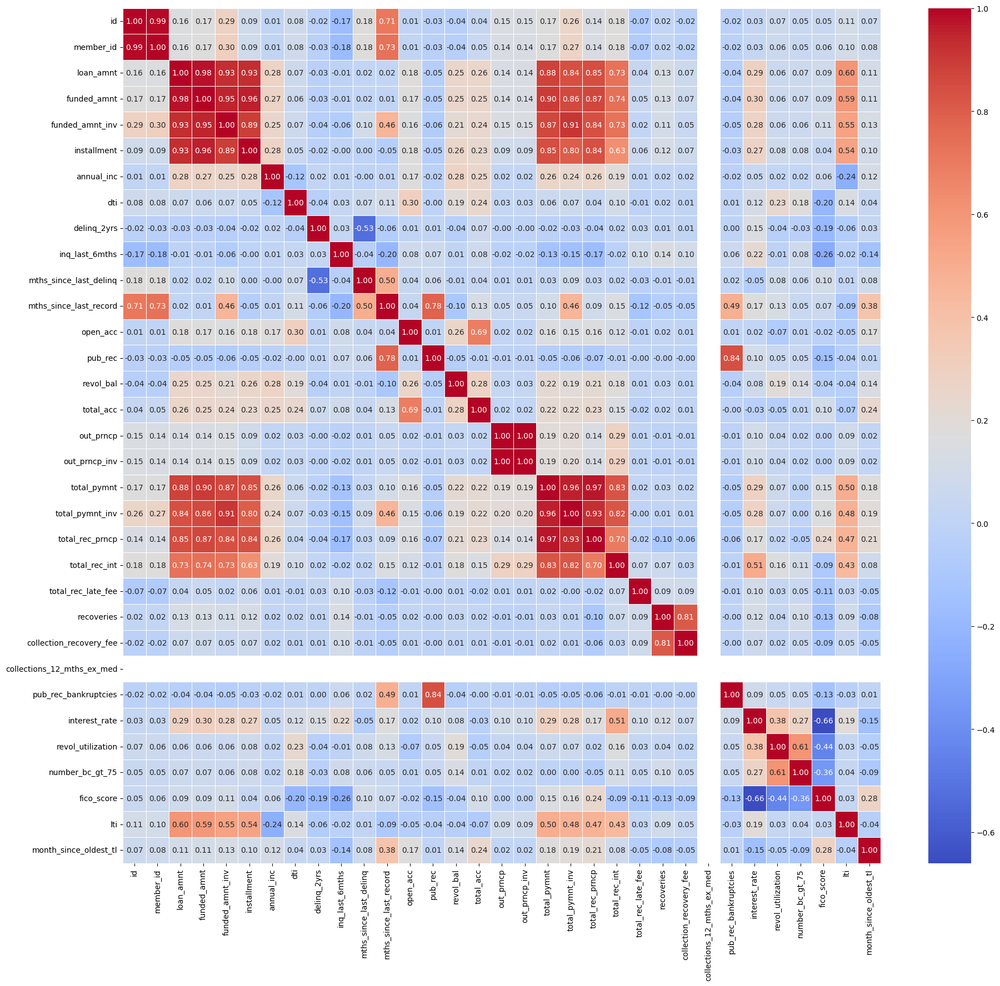

In [ ]:
corr_matrix = num64_.corr()

# Round off the correlation values to two decimal points
rounded_corr_matrix = corr_matrix.round(2)

# Plot the heatmap
plt.figure(figsize=(22, 20))
sns.heatmap(rounded_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

#Imputing null values

In [ ]:
num64_.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
installment                       0
annual_inc                        4
dti                               0
delinq_2yrs                      29
inq_last_6mths                   29
mths_since_last_delinq        26926
mths_since_last_record        38884
open_acc                         29
pub_rec                          29
revol_bal                         0
total_acc                        29
out_prncp                         0
out_prncp_inv                     0
total_pymnt                       0
total_pymnt_inv                   0
total_rec_prncp                   0
total_rec_int                     0
total_rec_late_fee                0
recoveries                        0
collection_recovery_fee           0
collections_12_mths_ex_med      145
pub_rec_bankruptcies           1365
interest_rate               

<Axes: >

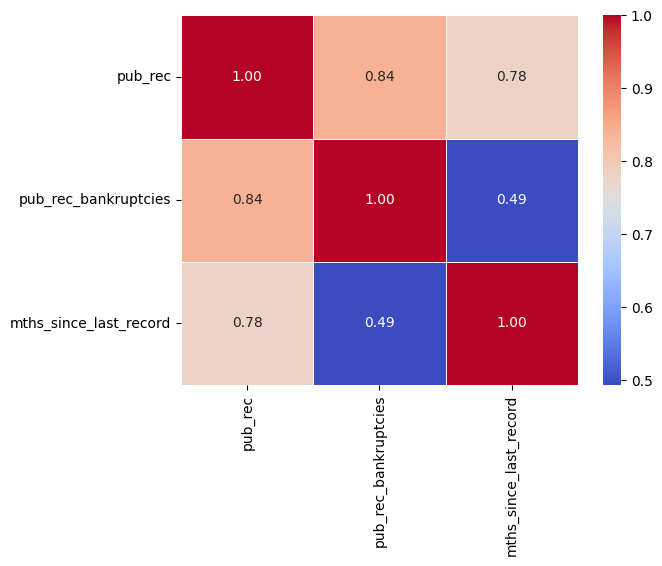

In [ ]:
correlation_matrix = num64_[['pub_rec', 'pub_rec_bankruptcies','mths_since_last_record']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

In [ ]:

cols= ['pub_rec','pub_rec_bankruptcies','mths_since_last_record'] # based on correlation factor
X=num64_[cols]
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
impute_it = IterativeImputer()
X_imputed = impute_it.fit_transform(X)
num64_[cols] = X_imputed

In [ ]:
num64_.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
installment                       0
annual_inc                        4
dti                               0
delinq_2yrs                      29
inq_last_6mths                   29
mths_since_last_delinq        26926
mths_since_last_record            0
open_acc                         29
pub_rec                           0
revol_bal                         0
total_acc                        29
out_prncp                         0
out_prncp_inv                     0
total_pymnt                       0
total_pymnt_inv                   0
total_rec_prncp                   0
total_rec_int                     0
total_rec_late_fee                0
recoveries                        0
collection_recovery_fee           0
collections_12_mths_ex_med      145
pub_rec_bankruptcies              0
interest_rate               

<Axes: >

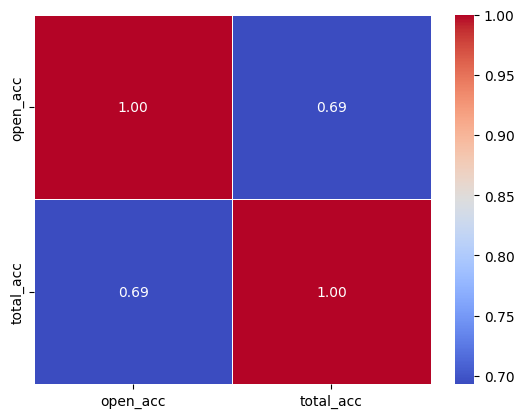

In [ ]:
correlation_matrix = num64_[['open_acc', 'total_acc']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

In [ ]:
from sklearn.impute import KNNImputer
cols=['open_acc','total_acc'] # based on correlation factor
X=num64_[cols]
impute_knn = KNNImputer(n_neighbors=2)
X_imputed_ = impute_knn.fit_transform(X)
num64_[cols] = X_imputed_

In [ ]:
num64_.isnull().sum()


id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
installment                       0
annual_inc                        4
dti                               0
delinq_2yrs                      29
inq_last_6mths                   29
mths_since_last_delinq        26926
mths_since_last_record            0
open_acc                          0
pub_rec                           0
revol_bal                         0
total_acc                         0
out_prncp                         0
out_prncp_inv                     0
total_pymnt                       0
total_pymnt_inv                   0
total_rec_prncp                   0
total_rec_int                     0
total_rec_late_fee                0
recoveries                        0
collection_recovery_fee           0
collections_12_mths_ex_med      145
pub_rec_bankruptcies              0
interest_rate               

In [ ]:
print(num64_['annual_inc'].value_counts())
print(num64_['annual_inc'].describe())

annual_inc
60000.0    1591
50000.0    1119
40000.0     935
45000.0     898
30000.0     884
           ... 
40001.0       1
49176.0       1
62304.0       1
47342.0       1
88080.0       1
Name: count, Length: 5597, dtype: int64
count    4.253100e+04
mean     6.913656e+04
std      6.409635e+04
min      1.896000e+03
25%      4.000000e+04
50%      5.900000e+04
75%      8.250000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64


In [ ]:
print(num64_['delinq_2yrs'].value_counts())
print(num64_['delinq_2yrs'].describe())

delinq_2yrs
0.0     37771
1.0      3595
2.0       771
3.0       244
4.0        72
5.0        27
6.0        13
7.0         6
8.0         3
11.0        2
13.0        1
9.0         1
Name: count, dtype: int64
count    42506.000000
mean         0.152449
std          0.512406
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         13.000000
Name: delinq_2yrs, dtype: float64


In [ ]:
print(num64_['inq_last_6mths'].value_counts(normalize=True))
print(num64_['inq_last_6mths'].describe())

inq_last_6mths
0.0     0.415847
1.0     0.249777
2.0     0.153531
3.0     0.092599
4.0     0.039571
5.0     0.021550
6.0     0.012116
7.0     0.005858
8.0     0.003741
9.0     0.002164
10.0    0.001153
11.0    0.000588
12.0    0.000353
13.0    0.000235
15.0    0.000188
18.0    0.000141
16.0    0.000118
14.0    0.000118
17.0    0.000071
19.0    0.000047
24.0    0.000047
27.0    0.000024
28.0    0.000024
31.0    0.000024
22.0    0.000024
26.0    0.000024
32.0    0.000024
33.0    0.000024
21.0    0.000024
Name: proportion, dtype: float64
count    42506.000000
mean         1.306357
std          1.711415
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         33.000000
Name: inq_last_6mths, dtype: float64


In [ ]:
print(num64_['revol_utilization'].value_counts(normalize=True))
print(num64_['revol_utilization'].describe())

revol_utilization
0.0000    0.025209
0.0020    0.002568
0.0050    0.002356
0.0070    0.002356
0.0010    0.002332
            ...   
0.0849    0.000024
0.8848    0.000024
0.0743    0.000024
0.1163    0.000024
0.2489    0.000024
Name: proportion, Length: 1098, dtype: float64
count    42445.000000
mean         0.442584
std          0.306107
min          0.000000
25%          0.166000
50%          0.446000
75%          0.701000
max          1.088000
Name: revol_utilization, dtype: float64


In [ ]:
print(num64_['lti'].value_counts())
print(num64_['lti'].describe())

lti
0.200000    697
0.166667    630
0.100000    516
0.250000    494
0.333333    399
           ... 
0.166511      1
0.050890      1
0.129833      1
0.107674      1
0.288101      1
Name: count, Length: 13344, dtype: int64
count    42531.000000
mean         0.186105
std          0.116228
min          0.000789
25%          0.097674
50%          0.162813
75%          0.250000
max          1.337500
Name: lti, dtype: float64


In [ ]:
print(num64_['mths_since_last_delinq'].value_counts(normalize=True))
print(num64_['mths_since_last_delinq'].describe())

mths_since_last_delinq
0.0      0.052598
30.0     0.017298
23.0     0.017041
19.0     0.017041
15.0     0.016849
           ...   
120.0    0.000064
115.0    0.000064
96.0     0.000064
97.0     0.000064
107.0    0.000064
Name: proportion, Length: 95, dtype: float64
count    15609.000000
mean        35.017618
std         22.418427
min          0.000000
25%         17.000000
50%         33.000000
75%         51.000000
max        120.000000
Name: mths_since_last_delinq, dtype: float64


In [ ]:
print(num64_['month_since_oldest_tl'].value_counts(normalize=True))
print(num64_['month_since_oldest_tl'].describe())

month_since_oldest_tl
63.0     0.010234
52.0     0.010116
72.0     0.010022
54.0     0.009904
71.0     0.009763
           ...   
443.0    0.000024
685.0    0.000024
440.0    0.000024
524.0    0.000024
442.0    0.000024
Name: proportion, Length: 456, dtype: float64
count    42506.000000
mean       107.567073
std         58.874550
min          1.000000
25%         67.000000
50%         98.000000
75%        134.000000
max        685.000000
Name: month_since_oldest_tl, dtype: float64


comparing this median will be good enough to replace the null values.

In [ ]:
print(num64_['collections_12_mths_ex_med'].value_counts(normalize=True))
print(num64_['collections_12_mths_ex_med'].describe())

collections_12_mths_ex_med
0.0    1.0
Name: proportion, dtype: float64
count    42390.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: collections_12_mths_ex_med, dtype: float64


sice all the values in the column 'collections_12_mths_ex_med' are 0 therefore this column won't provide any useful information for analysis or modeling because it lacks variability. so we can drop this column as well.

In [ ]:
num64_.drop(columns=['collections_12_mths_ex_med'],axis = 1,inplace = True)

In [ ]:
# num64_['inq_last_6mths'].fillna(num64_['inq_last_6mths'].mode()[0], inplace=True)
# num64_['delinq_2yrs'].fillna(num64_['delinq_2yrs'].median(), inplace=True) # have replace the delinq_2yrs null values with median value .
# num64_['annual_inc'].fillna(num64_['annual_inc'].median(), inplace=True) # have replace the annual_inc null values with median value .
# num64_['revol_utilization'].fillna(num64_['revol_utilization'].mode()[0],inplace = True)
# num64_['mths_since_last_delinq'].fillna(num64_['revol_utilization'].mode()[0],inplace = True)
# num64_['lti'].fillna(num64_['lti'].median(),inplace = True)
# num64_['month_since_oldest_tl'].fillna(num64_['month_since_oldest_tl'].mode()[0],inplace = True)
# num64_.isnull().sum()

In [ ]:
num64_['inq_last_6mths'].fillna(num64_['inq_last_6mths'].mode()[0], inplace=True)
num64_['delinq_2yrs'].fillna(num64_['delinq_2yrs'].median(), inplace=True) # have replace the delinq_2yrs null values with median value .
num64_['annual_inc'].fillna(num64_['annual_inc'].median(), inplace=True) # have replace the annual_inc null values with median value .
num64_['open_acc'].fillna(num64_['open_acc'].median(),inplace = True)
num64_['pub_rec'].fillna(num64_['pub_rec'].median(),inplace = True)
num64_['total_acc'].fillna(num64_['total_acc'].median(),inplace = True)
num64_['pub_rec_bankruptcies'].fillna(num64_['pub_rec_bankruptcies'].median(),inplace = True) # not much use contains  0.0 -->  39316 ; 1.0  -->   1846 ; 2.0 -->  8
num64_['revol_utilization'].fillna(num64_['revol_utilization'].mode()[0],inplace = True)
num64_['lti'].fillna(num64_['lti'].median(),inplace = True)
num64_['month_since_oldest_tl'].fillna(num64_['month_since_oldest_tl'].mode()[0],inplace = True)
num64_['mths_since_last_delinq'].fillna(num64_['month_since_oldest_tl'].mode()[0],inplace = True)
num64_.isnull().sum()

id                         0
member_id                  0
loan_amnt                  0
funded_amnt                0
funded_amnt_inv            0
installment                0
annual_inc                 0
dti                        0
delinq_2yrs                0
inq_last_6mths             0
mths_since_last_delinq     0
mths_since_last_record     0
open_acc                   0
pub_rec                    0
revol_bal                  0
total_acc                  0
out_prncp                  0
out_prncp_inv              0
total_pymnt                0
total_pymnt_inv            0
total_rec_prncp            0
total_rec_int              0
total_rec_late_fee         0
recoveries                 0
collection_recovery_fee    0
pub_rec_bankruptcies       0
interest_rate              0
revol_utilization          0
number_bc_gt_75            0
fico_score                 0
lti                        0
month_since_oldest_tl      0
dtype: int64

In [ ]:
df['loan_status'].value_counts()

loan_status
Fully Paid                                             33586
Charged Off                                             5653
Does not meet the credit policy. Status:Fully Paid      1988
Does not meet the credit policy. Status:Charged Off      761
Current                                                  513
In Grace Period                                           16
Late (31-120 days)                                        12
Late (16-30 days)                                          5
Default                                                    1
Name: count, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
label_encoder.fit(df['loan_status'])

def custom_encode(label):
    if label in ["Fully Paid", "Current", "In Grace Period", "Late (16-30 days)"]:
        return 1
    else:
        return 0

object_['encoded_loan_status'] = object_['loan_status'].apply(custom_encode)
print(object_['encoded_loan_status'].value_counts())



encoded_loan_status
1    34120
0     8415
Name: count, dtype: int64


In [ ]:

combined_df1 = pd.concat([num64_ ,object_], axis=1)
combined_df1.shape

(42535, 47)

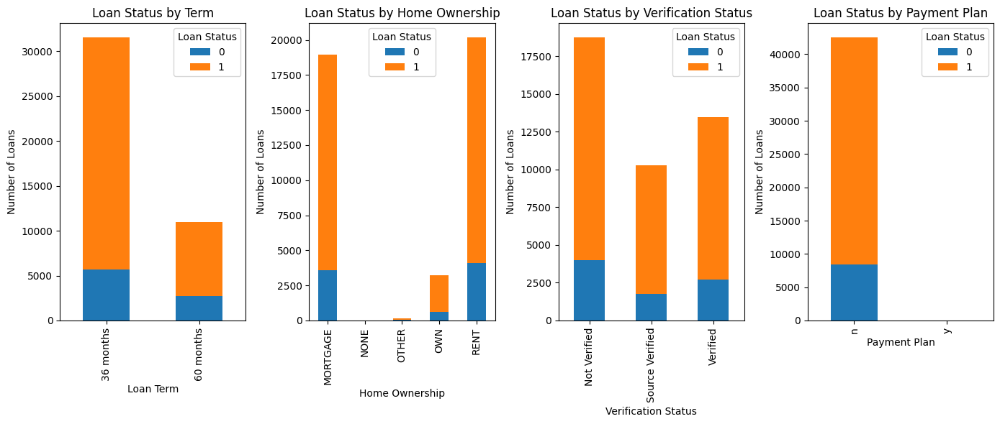

In [ ]:

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 4))
fig.subplots_adjust(hspace=0.4, wspace=1)

# Plot each bar plot in the corresponding subplot
combined_df1.groupby(['term', 'encoded_loan_status']).size().unstack().plot(kind='bar', stacked=True, ax=axes[0], figsize=(14, 6))
axes[0].set_title('Loan Status by Term')
axes[0].set_xlabel('Loan Term')
axes[0].set_ylabel('Number of Loans')
axes[0].legend(title='Loan Status')

combined_df1.groupby(['home_ownership', 'encoded_loan_status']).size().unstack().plot(kind='bar', stacked=True, ax=axes[1], figsize=(14, 6))
axes[1].set_title('Loan Status by Home Ownership')
axes[1].set_xlabel('Home Ownership')
axes[1].set_ylabel('Number of Loans')
axes[1].legend(title='Loan Status')

combined_df1.groupby(['verification_status', 'encoded_loan_status']).size().unstack().plot(kind='bar', stacked=True, ax=axes[2], figsize=(14, 6))
axes[2].set_title('Loan Status by Verification Status')
axes[2].set_xlabel('Verification Status')
axes[2].set_ylabel('Number of Loans')
axes[2].legend(title='Loan Status')

combined_df1.groupby(['pymnt_plan', 'encoded_loan_status']).size().unstack().plot(kind='bar', stacked=True, ax=axes[3], figsize=(14, 6))
axes[3].set_title('Loan Status by Payment Plan')
axes[3].set_xlabel('Payment Plan')
axes[3].set_ylabel('Number of Loans')
axes[3].legend(title='Loan Status')

# Show the plots
plt.tight_layout()
plt.show()


* From the above graphs we can observe that the probability of approval will be higher in cases where the loan term is for 60 months as compared to 36 months. This can be due to the fact that the customer getting more time to pay back is less likely to default.
* People havinh their own houses have lesser number of loan applications.

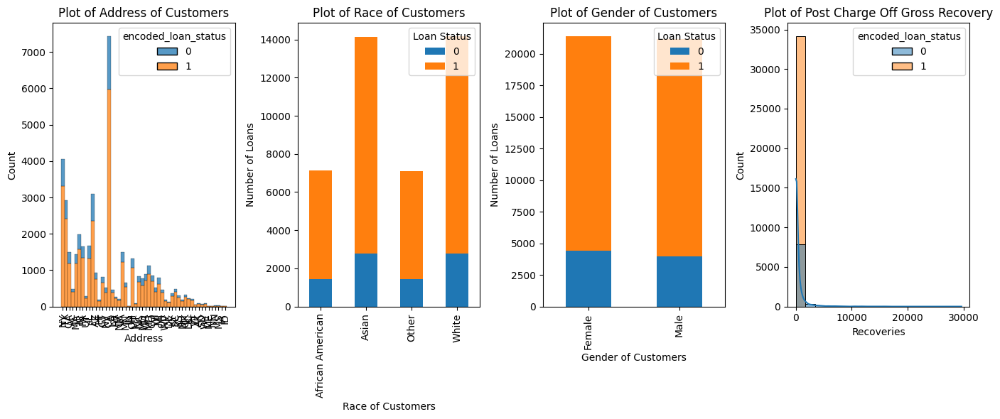

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.6)

# Plot each distribution plot using sns.histplot to ensure compatibility with plt.subplots
sns.histplot(data=combined_df1, x="addr_state", hue="encoded_loan_status", binwidth=1000, multiple="stack", ax=axes[0])
axes[0].set_title('Plot of Address of Customers')
axes[0].set_xlabel('Address')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=90)

# Bar plot for race_name
combined_df1.groupby(['race_name', 'encoded_loan_status']).size().unstack().plot(kind='bar', stacked=True, ax=axes[1], figsize=(14, 6))
axes[1].set_title('Plot of Race of Customers')
axes[1].set_xlabel('Race of Customers')
axes[1].set_ylabel('Number of Loans')
axes[1].legend(title='Loan Status')

# Bar plot for gender
combined_df1.groupby(['gender', 'encoded_loan_status']).size().unstack().plot(kind='bar', stacked=True, ax=axes[2], figsize=(14, 6))
axes[2].set_title('Plot of Gender of Customers')
axes[2].set_xlabel('Gender of Customers')
axes[2].set_ylabel('Number of Loans')
axes[2].legend(title='Loan Status')

# Distribution plot for recoveries
sns.histplot(data=combined_df1, x="recoveries", hue="encoded_loan_status", kde=True, ax=axes[3])
axes[3].set_title('Plot of Post Charge Off Gross Recovery')
axes[3].set_xlabel('Recoveries')
axes[3].set_ylabel('Count')

# Show the plots
plt.tight_layout()
plt.show()

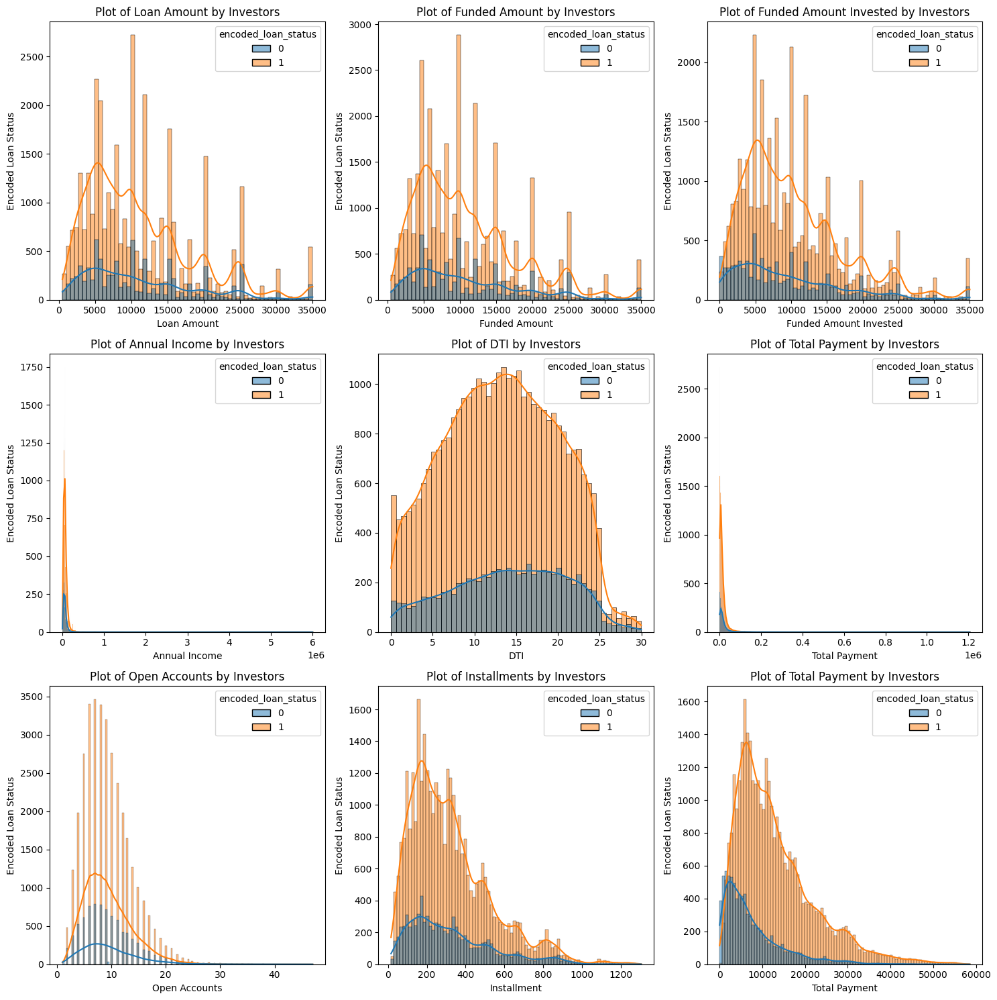

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Plot each distribution plot
sns.histplot(data=combined_df1, x="loan_amnt", hue="encoded_loan_status", kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Plot of Loan Amount by Investors')
axes[0, 0].set_xlabel('Loan Amount')
axes[0, 0].set_ylabel('Encoded Loan Status')

sns.histplot(data=combined_df1, x="funded_amnt", hue="encoded_loan_status", kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Plot of Funded Amount by Investors')
axes[0, 1].set_xlabel('Funded Amount')
axes[0, 1].set_ylabel('Encoded Loan Status')

sns.histplot(data=combined_df1, x="funded_amnt_inv", hue="encoded_loan_status", kde=True, ax=axes[0, 2])
axes[0, 2].set_title('Plot of Funded Amount Invested by Investors')
axes[0, 2].set_xlabel('Funded Amount Invested')
axes[0, 2].set_ylabel('Encoded Loan Status')

sns.histplot(data=combined_df1, x="annual_inc", hue="encoded_loan_status", kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Plot of Annual Income by Investors')
axes[1, 0].set_xlabel('Annual Income')
axes[1, 0].set_ylabel('Encoded Loan Status')

sns.histplot(data=combined_df1, x="dti", hue="encoded_loan_status", kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Plot of DTI by Investors')
axes[1, 1].set_xlabel('DTI')
axes[1, 1].set_ylabel('Encoded Loan Status')

sns.histplot(data=combined_df1, x="revol_bal", hue="encoded_loan_status", kde=True, ax=axes[1,2])
axes[1,2].set_title('Plot of Total Payment by Investors')
axes[1,2].set_xlabel('Total Payment')
axes[1,2].set_ylabel('Encoded Loan Status')

sns.histplot(data=combined_df1, x="open_acc", hue="encoded_loan_status", kde=True, ax=axes[2, 0])
axes[2, 0].set_title('Plot of Open Accounts by Investors')
axes[2, 0].set_xlabel('Open Accounts')
axes[2, 0].set_ylabel('Encoded Loan Status')

sns.histplot(data=combined_df1, x="installment", hue="encoded_loan_status", kde=True, ax=axes[2, 1])
axes[2, 1].set_title('Plot of Installments by Investors')
axes[2, 1].set_xlabel('Installment')
axes[2, 1].set_ylabel('Encoded Loan Status')

sns.histplot(data=combined_df1, x="total_pymnt", hue="encoded_loan_status", kde=True, ax=axes[2,2])
axes[2,2].set_title('Plot of Total Payment by Investors')
axes[2,2].set_xlabel('Total Payment')
axes[2,2].set_ylabel('Encoded Loan Status')

# Show the plots
plt.tight_layout()
plt.show()

In [ ]:
combined_df1.columns


Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'installment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'pub_rec_bankruptcies', 'interest_rate', 'revol_utilization',
       'number_bc_gt_75', 'fico_score', 'lti', 'month_since_oldest_tl', 'term',
       'emp_title', 'emp_length', 'home_ownership', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'desc', 'purpose', 'title',
       'addr_state', 'race_name', 'gender', 'encoded_loan_status'],
      dtype='object')

##### **dropping 'id', 'member_id', 'emp_title' ,'desc', 'title', 'loan_status'**

In [ ]:
combined_df1.drop(columns=['emp_title','desc','title'],axis = 1,inplace = True)  # dropping 3 columns as believed they were of less importace.
combined_df1.drop(columns=['loan_status'],axis = 1,inplace = True) # we have already encoded this column as encoded column.

In [ ]:
combined_df1.drop(columns=['id', 'member_id'],axis = 1,inplace = True)

In [ ]:
import pandas as pd

# Define ordinal encoding
ordinal_mapping = {'36 months': 36,'60 months': 60}

# Apply ordinal encoding
combined_df1['term'] = object_['term'].map(ordinal_mapping)
# print(df)
combined_df1['term']

0        60
1        36
2        60
3        60
4        60
         ..
42530    36
42531    36
42532    36
42533    60
42534    60
Name: term, Length: 42535, dtype: int64

Text(0, 0.5, 'Encoded Loan Status')

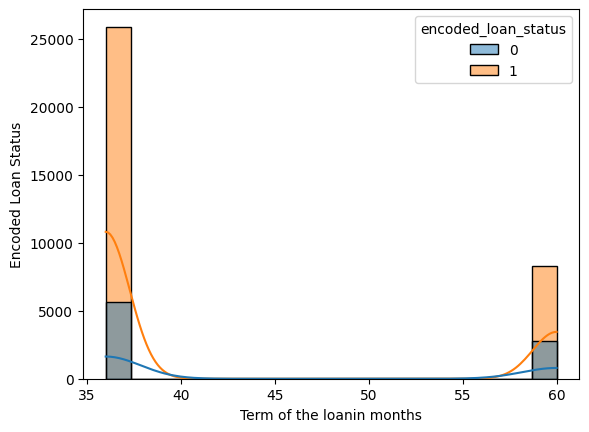

In [ ]:
ax = sns.histplot(data=combined_df1, x="term", hue="encoded_loan_status", kde=True)

# Set the title and labels
# ax.set_title('Plot of Total Payment by Investors')
ax.set_xlabel('Term of the loanin months')
ax.set_ylabel('Encoded Loan Status')

# Encoding non numeric data

In [ ]:

ordinal_mapping = {
    '< 1 year': 0,
    '1 year': 1,
    '2 years': 2,
    '3 years': 3,
    '4 years': 4,
    '5 years': 5,
    '6 years': 6,
    '7 years': 7,
    '8 years': 8,
    '9 years': 9,
    '10+ years': 10
}

# Apply ordinal encoding
combined_df1['emp_length'] = object_['emp_length'].map(ordinal_mapping)
# print(df)
combined_df1['emp_length']

0        1.0
1        6.0
2        9.0
3        9.0
4        0.0
        ... 
42530    3.0
42531    5.0
42532    3.0
42533    4.0
42534    1.0
Name: emp_length, Length: 42535, dtype: float64

Text(0, 0.5, 'Encoded Loan Status')

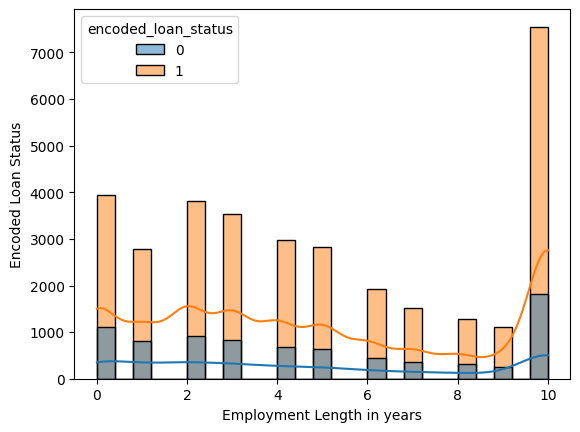

In [ ]:
ax = sns.histplot(data=combined_df1, x="emp_length", hue="encoded_loan_status", kde=True)

# ax.set_title('Plot of Total Payment by Investors')
ax.set_xlabel('Employment Length in years')
ax.set_ylabel('Encoded Loan Status')

In [ ]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
combined_df1['home_ownership'] = label_encoder.fit_transform(combined_df1['home_ownership'])
combined_df1['pymnt_plan'] = label_encoder.fit_transform(combined_df1['pymnt_plan'])
combined_df1['gender'] = label_encoder.fit_transform(combined_df1['gender'])
combined_df1['race_name'] = label_encoder.fit_transform(combined_df1['race_name'])
combined_df1['verification_status'] = label_encoder.fit_transform(combined_df1['verification_status'])
combined_df1['purpose'] = label_encoder.fit_transform(combined_df1['purpose'])
combined_df1['addr_state'] = label_encoder.fit_transform(combined_df1['addr_state'])
combined_df1['issue_d'] = label_encoder.fit_transform(combined_df1['issue_d'])

In [ ]:
from sklearn.impute import KNNImputer
cols=['term', 'emp_length', 'home_ownership', 'verification_status',
       'issue_d', 'pymnt_plan', 'purpose', 'addr_state', 'race_name', 'gender',
       ] #filling up the emp_length
X=combined_df1[cols]
impute_knn = KNNImputer(n_neighbors=7)
X_imputed_ = impute_knn.fit_transform(X)
combined_df1[cols] = X_imputed_


In [ ]:
combined_df1.isnull().sum()


loan_amnt                  0
funded_amnt                0
funded_amnt_inv            0
installment                0
annual_inc                 0
dti                        0
delinq_2yrs                0
inq_last_6mths             0
mths_since_last_delinq     0
mths_since_last_record     0
open_acc                   0
pub_rec                    0
revol_bal                  0
total_acc                  0
out_prncp                  0
out_prncp_inv              0
total_pymnt                0
total_pymnt_inv            0
total_rec_prncp            0
total_rec_int              0
total_rec_late_fee         0
recoveries                 0
collection_recovery_fee    0
pub_rec_bankruptcies       0
interest_rate              0
revol_utilization          0
number_bc_gt_75            0
fico_score                 0
lti                        0
month_since_oldest_tl      0
term                       0
emp_length                 0
home_ownership             0
verification_status        0
issue_d       

In [ ]:
combined_df1.dtypes.value_counts()
# here we observe that we are still having loan_status as a column even after

float64    35
int64       6
Name: count, dtype: int64

In [ ]:
combined_df1.shape

(42535, 41)

In [ ]:
x = combined_df1.drop(["encoded_loan_status"],axis=1)
y = combined_df1["encoded_loan_status"]

from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=42)

In [ ]:
print(x.shape)
print(y.shape)
print("x_train shape:")
print(x_train.shape)
print("x_train shape:")
print(x_test.shape)
print("y_train shape:")
print(y_train.shape)
print("y_test shape:")
print(y_test.shape)

(42535, 40)
(42535,)
x_train shape:
(29774, 40)
x_train shape:
(12761, 40)
y_train shape:
(29774,)
y_test shape:
(12761,)


In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, accuracy_score

# dtree = tree.DecisionTreeClassifier()
dtree.fit(x_train,y_train)
dtreepred = dtree.predict(x_test)
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
print(classification_report(y_test,dtreepred))
print("Accuracy of Decision Tree is : ",accuracy_score(y_test,dtreepred)*100)

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      2528
           1       0.99      0.99      0.99     10233

    accuracy                           0.99     12761
   macro avg       0.98      0.98      0.98     12761
weighted avg       0.99      0.99      0.99     12761

Accuracy of Decision Tree is :  98.65214324896168


In [ ]:
print("Mean Absolute Error : ",mean_absolute_error(y_test,dtreepred))
print("Mean Squared Error : ",mean_squared_error(y_test,dtreepred))
print("Root Mean Squared Error : ",np.sqrt(mean_squared_error(y_test,dtreepred)))
print("R2 Score : ",r2_score(y_test,dtreepred))

Mean Absolute Error :  0.0134785675103832
Mean Squared Error :  0.0134785675103832
Root Mean Squared Error :  0.11609723300054657
R2 Score :  0.9151536602231302


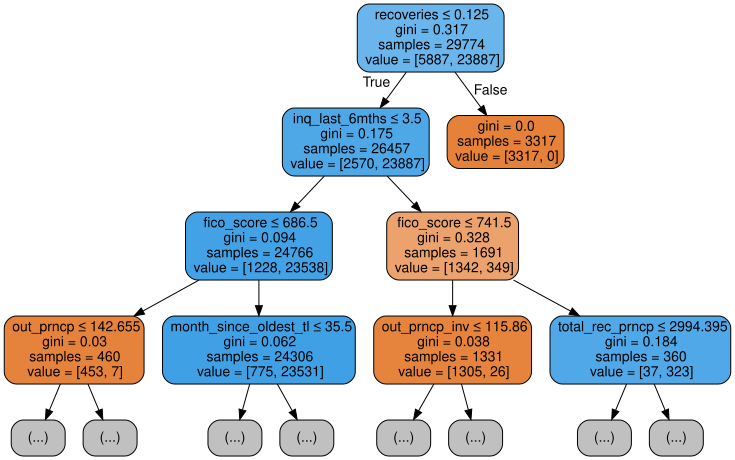

In [ ]:
from sklearn.tree import export_graphviz
import graphviz

# Assuming df is your DataFrame and x is the feature matrix
feature_names = combined_df1.columns.tolist()

# Remove 'encoded_status' from the list of feature names
if 'encoded_loan_status' in feature_names:
    feature_names.remove('encoded_loan_status')

# Set the max_depth parameter to limit the depth of the tree
dot_data = export_graphviz(dtree, out_file=None,
                           feature_names=feature_names,
                           filled=True,
                           max_depth=3,
                           rounded=True,
                           special_characters=True)

# Create a graphviz Source object with adjusted size
graph = graphviz.Source(dot_data, format="png")
graph.render(view=True, cleanup=True)
graph

In [ ]:
importances = dtree.feature_importances_
feature_importances = pd.DataFrame({'feature': x.columns, 'importance': importances})

feature_importances = feature_importances.sort_values('importance', ascending=False)
print(feature_importances)

                    feature  importance
21               recoveries    0.508713
7            inq_last_6mths    0.188645
27               fico_score    0.139002
29    month_since_oldest_tl    0.036595
18          total_rec_prncp    0.033712
12                revol_bal    0.017156
2           funded_amnt_inv    0.016739
4                annual_inc    0.007545
26          number_bc_gt_75    0.006280
0                 loan_amnt    0.004650
5                       dti    0.004239
24            interest_rate    0.003544
3               installment    0.002827
34                  issue_d    0.002537
8    mths_since_last_delinq    0.002483
16              total_pymnt    0.002413
23     pub_rec_bankruptcies    0.002367
17          total_pymnt_inv    0.002346
10                 open_acc    0.002223
25        revol_utilization    0.002220
13                total_acc    0.001629
28                      lti    0.001495
1               funded_amnt    0.001454
31               emp_length    0.001322


In [ ]:
from sklearn.linear_model import LogisticRegression
reg = LogisticRegression()
reg.fit(x_train,y_train)
regpred = reg.predict(x_test)

from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
print(classification_report(y_test,regpred))
print("Accuracy of Logistic Regression is : ",accuracy_score(y_test,regpred)*100)

              precision    recall  f1-score   support

           0       0.98      0.76      0.86      2528
           1       0.94      1.00      0.97     10233

    accuracy                           0.95     12761
   macro avg       0.96      0.88      0.91     12761
weighted avg       0.95      0.95      0.95     12761

Accuracy of Logistic Regression is :  95.01606457174204


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
import numpy as np
print("Mean Absolute Error : ",mean_absolute_error(y_test,regpred))
print("Mean Squared Error : ",mean_squared_error(y_test,regpred))
print("Root Mean Squared Error : ",np.sqrt(mean_squared_error(y_test,regpred)))
print("R2 Score : ",r2_score(y_test,regpred))

Mean Absolute Error :  0.04983935428257973
Mean Squared Error :  0.04983935428257973
Root Mean Squared Error :  0.22324729400953494
R2 Score :  0.6862658598948301


In [ ]:
importances = dtree.feature_importances_
feature_importances = pd.DataFrame({'feature': x.columns, 'importance': importances})

feature_importances = feature_importances.sort_values('importance', ascending=False)
print(feature_importances)

                    feature  importance
21               recoveries    0.508713
7            inq_last_6mths    0.188645
27               fico_score    0.139002
29    month_since_oldest_tl    0.036595
18          total_rec_prncp    0.033712
12                revol_bal    0.017156
2           funded_amnt_inv    0.016739
4                annual_inc    0.007545
26          number_bc_gt_75    0.006280
0                 loan_amnt    0.004650
5                       dti    0.004239
24            interest_rate    0.003544
3               installment    0.002827
34                  issue_d    0.002537
8    mths_since_last_delinq    0.002483
16              total_pymnt    0.002413
23     pub_rec_bankruptcies    0.002367
17          total_pymnt_inv    0.002346
10                 open_acc    0.002223
25        revol_utilization    0.002220
13                total_acc    0.001629
28                      lti    0.001495
1               funded_amnt    0.001454
31               emp_length    0.001322


### Second Approach by Removing Outliers

# Removing outliers-INTERQUARTILE RANGE METHOD
Outliers detection  using box plot method :

In [ ]:
num64_.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'installment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'pub_rec_bankruptcies', 'interest_rate', 'revol_utilization',
       'number_bc_gt_75', 'fico_score', 'lti', 'month_since_oldest_tl'],
      dtype='object')

In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create a list of columns to plot
# columns = ["annual_inc", "delinq_2yrs", "inq_last_6mths", "pub_rec", "out_prncp","out_prncp_inv", "total_pymnt", "total_pymnt_inv", "total_rec_prncp",
#            "total_rec_int", "collection_recovery_fee", "funded_amnt_inv", "total_rec_late_fee","loan_amnt", "funded_amnt", "revol_bal", "number_bc_gt_75", "fico_score"]

columns = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv','installment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths','mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'pub_rec_bankruptcies', 'interest_rate', 'revol_utilization',
       'number_bc_gt_75', 'fico_score', 'lti', 'month_since_oldest_tl']

# Create a subplot figure with appropriate layout
fig = make_subplots(rows=8, cols=4, subplot_titles=columns)

# Iterate through columns and add box plots to the subplots
for i, column in enumerate(columns):
    row = i // 4 + 1
    col = i % 4 + 1
    fig.add_trace(go.Box(y=combined_df1[column], name=column), row=row, col=col)

# Update layout for better appearance
fig.update_layout(height=2000, width=1200, title_text="Box Plots of Various Features")

# Show the plot
fig.show()


In [ ]:
def out_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_below = df[df[column] < lower_bound]
    outliers_above = df[df[column] > upper_bound]
    return outliers_below, outliers_above

columns = ["annual_inc", "delinq_2yrs", "inq_last_6mths", "pub_rec", "out_prncp",
           "out_prncp_inv", "total_pymnt", "total_pymnt_inv", "total_rec_prncp",
           "total_rec_int", "collection_recovery_fee", "funded_amnt_inv",
           "total_rec_late_fee", "loan_amnt", "funded_amnt", "revol_bal",
           "number_bc_gt_75", "fico_score"]

for column in columns:
    df1, df2 = out_iqr(combined_df1, column)
    total_outliers = df1.shape[0] + df2.shape[0]
    print(f'Total number of outliers in {column}: {total_outliers}')


Total number of outliers in annual_inc: 2032
Total number of outliers in delinq_2yrs: 4735
Total number of outliers in inq_last_6mths: 1153
Total number of outliers in pub_rec: 2405
Total number of outliers in out_prncp: 547
Total number of outliers in out_prncp_inv: 547
Total number of outliers in total_pymnt: 1428
Total number of outliers in total_pymnt_inv: 1547
Total number of outliers in total_rec_prncp: 1047
Total number of outliers in total_rec_int: 3356
Total number of outliers in collection_recovery_fee: 4292
Total number of outliers in funded_amnt_inv: 1154
Total number of outliers in total_rec_late_fee: 2387
Total number of outliers in loan_amnt: 1218
Total number of outliers in funded_amnt: 691
Total number of outliers in revol_bal: 2906
Total number of outliers in number_bc_gt_75: 850
Total number of outliers in fico_score: 1390


In [ ]:
df['pymnt_plan'].value_counts(normalize=True)*100

pymnt_plan
n    99.997649
y     0.002351
Name: proportion, dtype: float64

In [ ]:
df['pub_rec'].value_counts(normalize=True)*100

pub_rec
0.0    94.410201
1.0     5.406296
2.0     0.150567
3.0     0.025879
4.0     0.004705
5.0     0.002353
Name: proportion, dtype: float64

In [ ]:
df['collection_recovery_fee'].value_counts(normalize=True)*100

collection_recovery_fee
0.0000      89.909486
2.0000       0.035265
1.2000       0.025861
0.8000       0.023510
1.6000       0.023510
              ...    
153.1498     0.002351
119.5130     0.002351
195.2222     0.002351
57.6558      0.002351
0.5653       0.002351
Name: proportion, Length: 2857, dtype: float64

In [ ]:
combined_df1.drop(columns=['pymnt_plan','collection_recovery_fee','pub_rec'],axis=1,inplace=True)

In [ ]:
df1=combined_df1.drop(columns=['issue_d','purpose','addr_state','race_name','gender'])

<Axes: >

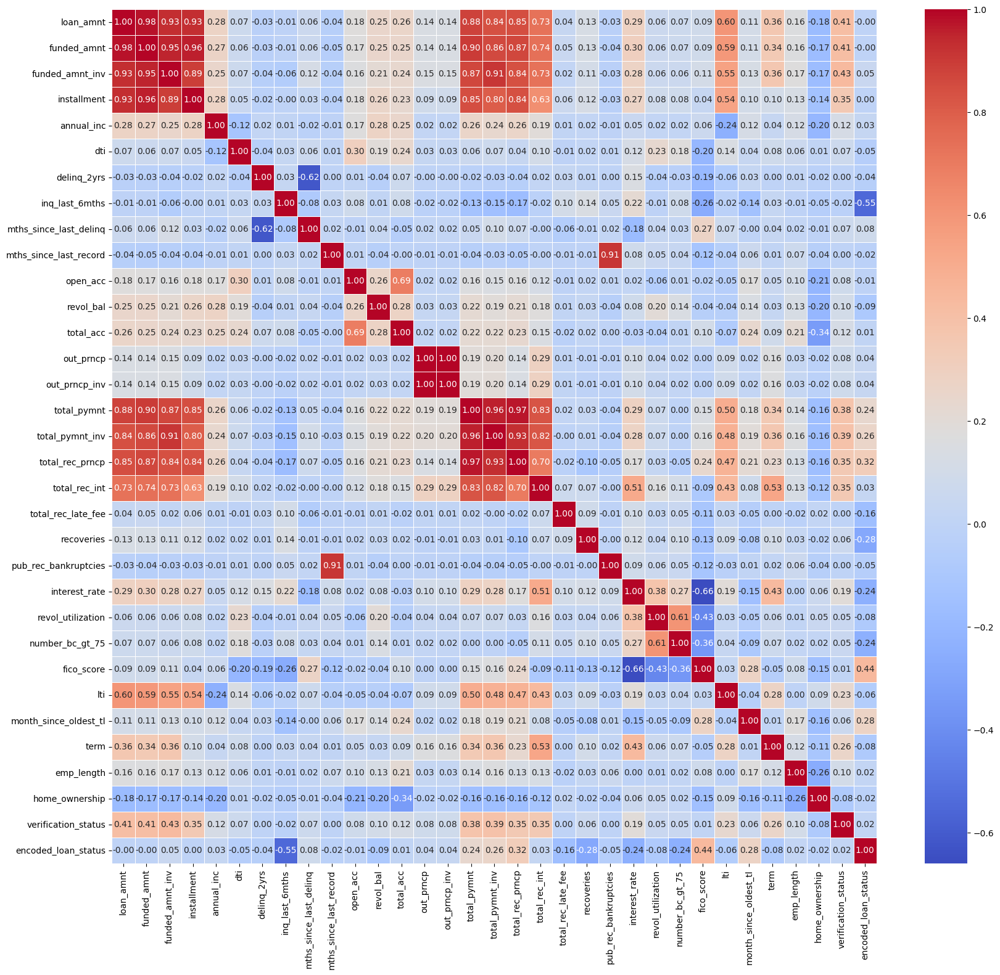

In [ ]:
corr_matrix = df1.corr()

# Round off the correlation values to two decimal points
rounded_corr_matrix = corr_matrix.round(2)

# Plot the heatmap
plt.figure(figsize=(20, 18))
sns.heatmap(rounded_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

<Axes: >

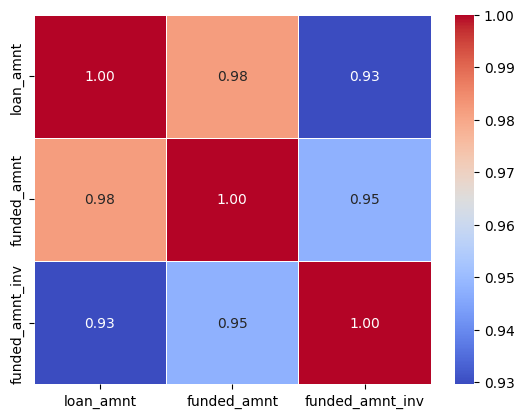

In [ ]:
correlation_matrix = combined_df1[['loan_amnt', 'funded_amnt','funded_amnt_inv']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

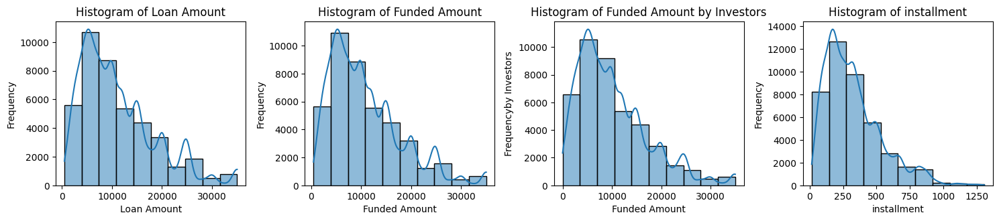

In [ ]:
# # Lets see distribution of three loan amount fields using distribution plot.

plt.figure(figsize=(15, 6))

plt.subplot(2, 4, 1)
sns.histplot(df['loan_amnt'], bins=10, kde=True)
plt.title('Histogram of Loan Amount')
plt.xlabel('Loan Amount')
plt.ylabel('Frequency')

# Histogram for funded_amt
plt.subplot(2, 4, 2)
sns.histplot(df['funded_amnt'], bins=10, kde=True)
plt.title('Histogram of Funded Amount')
plt.xlabel('Funded Amount')
plt.ylabel('Frequency')

plt.subplot(2, 4, 3)
sns.histplot(df['funded_amnt_inv'], bins=10, kde=True)
plt.title('Histogram of Funded Amount by Investors')
plt.xlabel('Funded Amount')
plt.ylabel('Frequencyby Investors')

plt.subplot(2, 4, 4)
sns.histplot(df['installment'], bins=10, kde=True)
plt.title('Histogram of installment')
plt.xlabel('installment')
plt.ylabel('Frequency')


plt.tight_layout()
# # Observation:
# # Distribution of amounts for all three look very much similar.
# # We will work with only loan amount column for rest of our analysis.

these 3 values are highly correlated any 1 can be used

In [ ]:

df1.drop(columns=['funded_amnt_inv', 'funded_amnt'], inplace=True)

<Axes: >

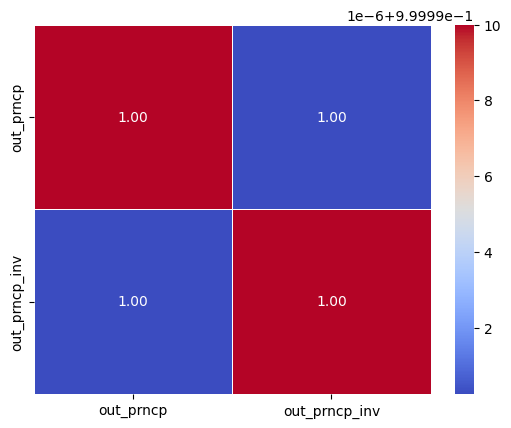

In [ ]:
correlation_matrix = df[['out_prncp','out_prncp_inv']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

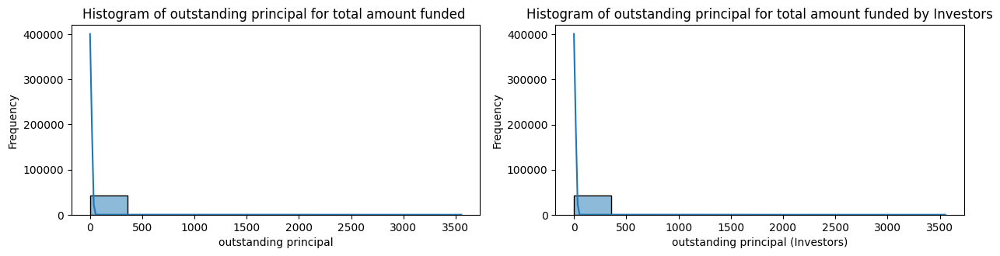

In [ ]:
# # Lets see distribution of three loan amount fields using distribution plot.

plt.figure(figsize=(18, 6))

# Histogram for funded_amt
plt.subplot(2, 3, 2)
sns.histplot(df['out_prncp'], bins=10, kde=True)
plt.title('Histogram of outstanding principal for total amount funded ')
plt.xlabel('outstanding principal')
plt.ylabel('Frequency')

plt.subplot(2, 3, 3)
sns.histplot(df['out_prncp_inv'], bins=10, kde=True)
plt.title('Histogram of outstanding principal for total amount funded by Investors')
plt.xlabel('outstanding principal (Investors)')
plt.ylabel('Frequency')

plt.tight_layout()


#  Observation:
Distribution of amounts for the two looks very much similar. We will work with only outstanding principal column for rest of our analysis.

In [ ]:
df1.drop(['out_prncp_inv'], axis=1, inplace=True)


In [ ]:
df1.shape

(42535, 30)

<Axes: >

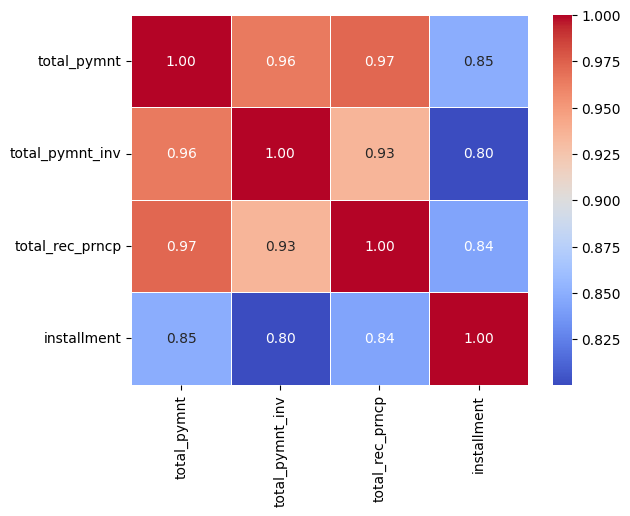

In [ ]:
correlation_matrix = df1[['total_pymnt','total_pymnt_inv','total_rec_prncp','installment']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

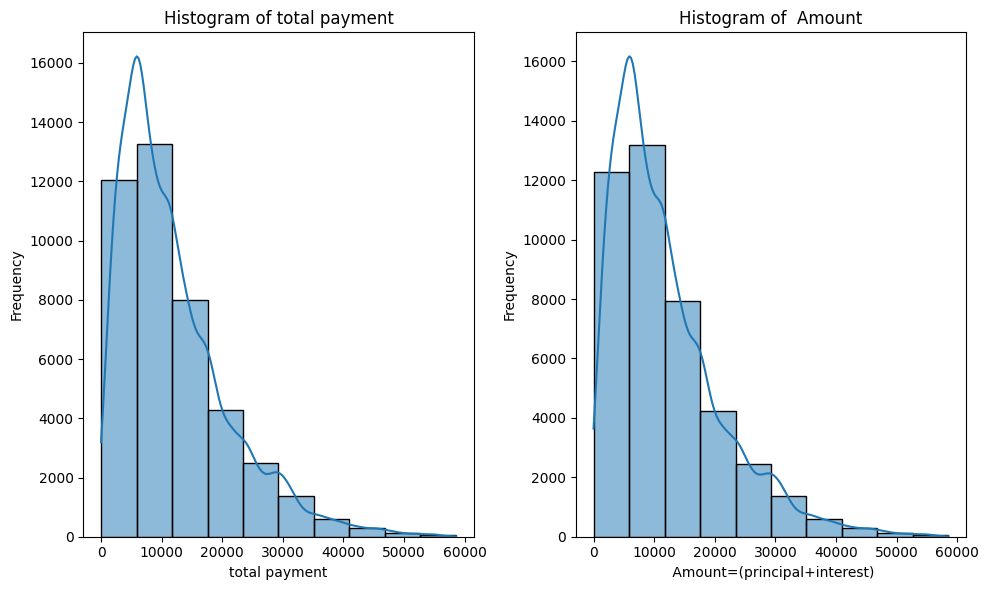

In [ ]:
plt.figure(figsize=(10, 6))

# Histogram for loan_amt
plt.subplot(1, 2, 1)
sns.histplot(df['total_pymnt'], bins=10, kde=True)
plt.title('Histogram of total payment')
plt.xlabel('total payment')
plt.ylabel('Frequency')

# Histogram for funded_amt
plt.subplot(1, 2, 2)
sns.histplot(df['total_rec_prncp']+df['total_rec_int'], bins=10, kde=True)
plt.title('Histogram of  Amount')
plt.xlabel(' Amount=(principal+interest)')
plt.ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

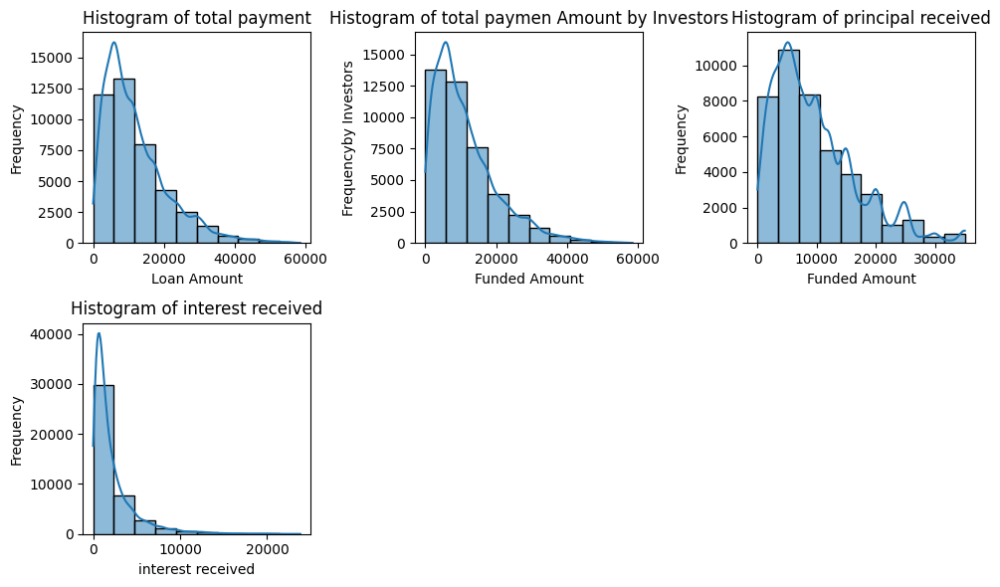

In [ ]:
# # Lets see distribution of three loan amount fields using distribution plot.

plt.figure(figsize=(10, 6))

plt.subplot(2, 3, 1)
sns.histplot(df['total_pymnt'], bins=10, kde=True)
plt.title('Histogram of total payment')
plt.xlabel('Loan Amount')
plt.ylabel('Frequency')



plt.subplot(2, 3, 2)
sns.histplot(df['total_pymnt_inv'], bins=10, kde=True)
plt.title('Histogram of total paymen Amount by Investors')
plt.xlabel('Funded Amount')
plt.ylabel('Frequencyby Investors')

# Histogram for funded_amt
plt.subplot(2, 3, 3)
sns.histplot(df['total_rec_prncp'], bins=10, kde=True)
plt.title('Histogram of principal received')
plt.xlabel('Funded Amount')
plt.ylabel('Frequency')

plt.subplot(2, 3, 4)
sns.histplot(df['total_rec_int'], bins=10, kde=True)
plt.title('Histogram of interest received')
plt.xlabel('interest received')
plt.ylabel('Frequency')

plt.tight_layout()
# # Observation:
# # Distribution of amounts for all three looks very much similar.
# # We will work with only loan amount column for rest of our analysis.

We see that total_rec_prncp+total_rec_int=total_pymnt
therefore we can further drop total_rec_prncp and total_rec_int
also drop total_pymnt_inv.

In [ ]:
df1.drop(['total_rec_prncp', 'total_rec_int', 'total_pymnt_inv'], axis=1, inplace=True)


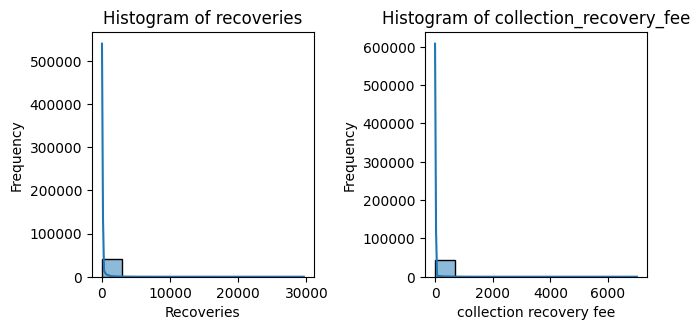

In [ ]:
# # Lets see distribution of three loan amount fields using distribution plot.

plt.figure(figsize=(10, 6))

plt.subplot(2, 3, 1)
sns.histplot(df['recoveries'], bins=10, kde=True)
plt.title('Histogram of recoveries')
plt.xlabel('Recoveries')
plt.ylabel('Frequency')



plt.subplot(2, 3, 2)
sns.histplot(df['collection_recovery_fee'], bins=10, kde=True)
plt.title('Histogram of collection_recovery_fee')
plt.xlabel('collection recovery fee')
plt.ylabel('Frequency')


plt.tight_layout()
# # Observation:
# # Distribution of amounts for all three looks very much similar.
# # We will work with only recoveries for rest of our analysis.

In [ ]:
# df1.drop('collection_recovery_fee', axis=1, inplace=True)


<Axes: >

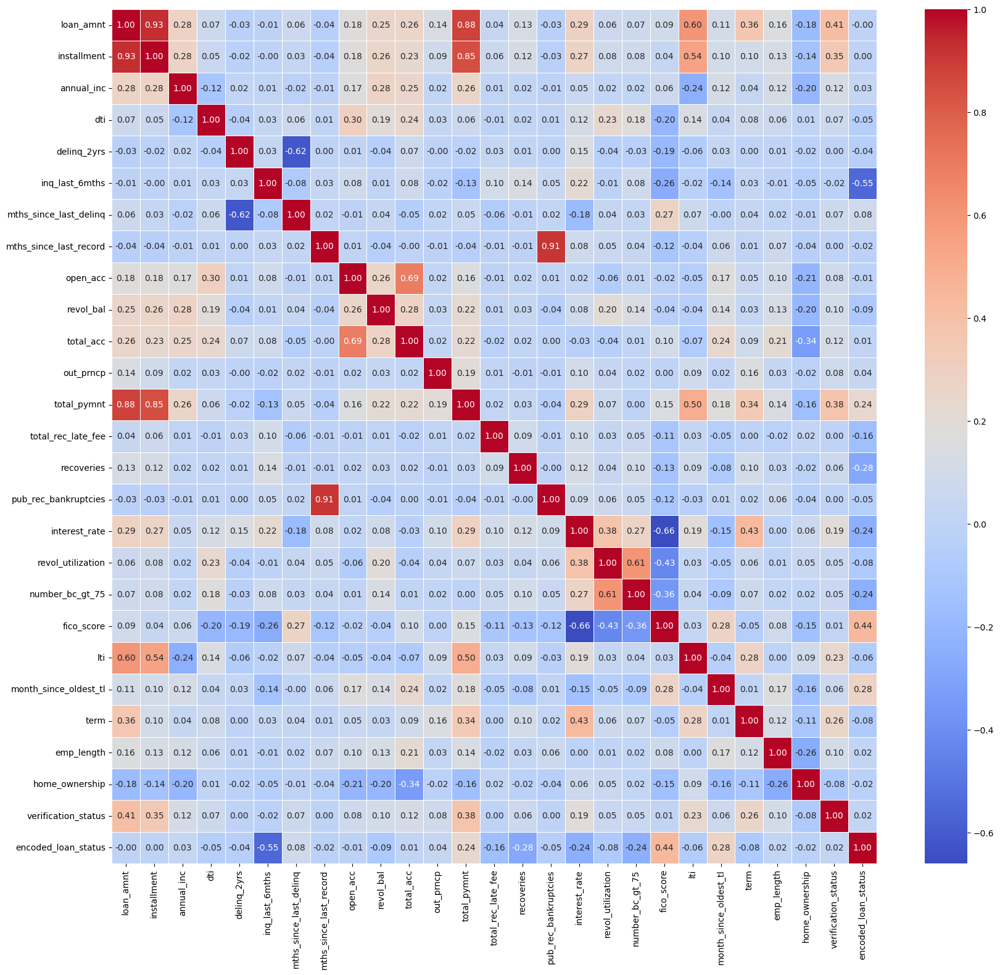

In [ ]:
corr_matrix = df1.corr()

# Round off the correlation values to two decimal points
rounded_corr_matrix = corr_matrix.round(2)

# Plot the heatmap
plt.figure(figsize=(20, 18))
sns.heatmap(rounded_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

In [ ]:
df1.shape

(42535, 27)

In [ ]:
df1.columns

Index(['loan_amnt', 'installment', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
       'open_acc', 'revol_bal', 'total_acc', 'out_prncp', 'total_pymnt',
       'total_rec_late_fee', 'recoveries', 'pub_rec_bankruptcies',
       'interest_rate', 'revol_utilization', 'number_bc_gt_75', 'fico_score',
       'lti', 'month_since_oldest_tl', 'term', 'emp_length', 'home_ownership',
       'verification_status', 'encoded_loan_status'],
      dtype='object')

In [ ]:
x2 = df1.drop(["encoded_loan_status"],axis=1)
y2= df1["encoded_loan_status"]

from sklearn.model_selection import train_test_split
x2_train,x2_test,y2_train,y2_test = train_test_split(x2,y2,test_size=0.3,random_state=42)

In [ ]:
print(x2.shape)
print(y2.shape)
print("Hello")
print(x2_train.shape)
print(x2_test.shape)
print("Bello")
print(y2_train.shape)
print(y2_test.shape)

(42535, 26)
(42535,)
Hello
(29774, 26)
(12761, 26)
Bello
(29774,)
(12761,)


In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, accuracy_score

# dtree = tree.DecisionTreeClassifier()
dtree.fit(x2_train,y2_train)
dtreepred = dtree.predict(x2_test)
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
print(classification_report(y2_test,dtreepred))
print("Accuracy of Decision Tree is : ",accuracy_score(y2_test,dtreepred)*100)

              precision    recall  f1-score   support

           0       0.97      0.96      0.96      2528
           1       0.99      0.99      0.99     10233

    accuracy                           0.99     12761
   macro avg       0.98      0.98      0.98     12761
weighted avg       0.99      0.99      0.99     12761

Accuracy of Decision Tree is :  98.58945223728549


In [ ]:
print("Mean Absolute Error : ",mean_absolute_error(y2_test,dtreepred))
print("Mean Squared Error : ",mean_squared_error(y2_test,dtreepred))
print("Root Mean Squared Error : ",np.sqrt(mean_squared_error(y2_test,dtreepred)))
print("R2 Score : ",r2_score(y2_test,dtreepred))

Mean Absolute Error :  0.014105477627145207
Mean Squared Error :  0.014105477627145207
Root Mean Squared Error :  0.11876648360183611
R2 Score :  0.9112073188381595


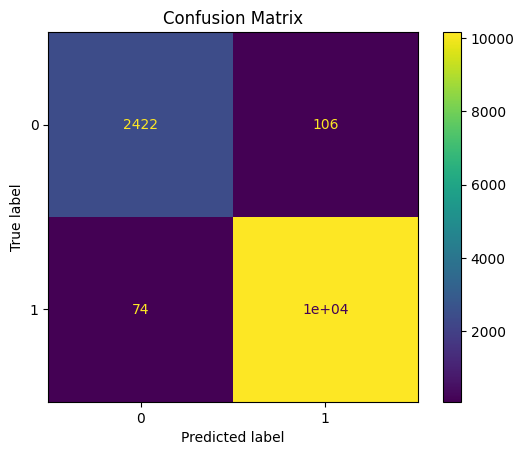

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from sklearn.metrics import make_scorer, precision_score, precision_recall_curve, PrecisionRecallDisplay
from sklearn.metrics import recall_score, roc_curve, RocCurveDisplay

disp = ConfusionMatrixDisplay.from_estimator(dtree, x2_test, y2_test)
disp.ax_.set_title('Confusion Matrix')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y2_test, dtreepred)

print('Confusion matrix:\n\n', cm)
print("\033[1m-----------------------------\033[0m")
print('\nTrue Positives(TP) = ', cm[0,0])
print("\033[1m-----------------------------\033[0m")
print('\nTrue Negatives(TN) = ', cm[1,1])
print("\033[1m-----------------------------\033[0m")
print('\nFalse Positives(FP) = ', cm[0,1])
print("\033[1m-----------------------------\033[0m")
print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix:

 [[ 2422   106]
 [   74 10159]]
-----------------------------

True Positives(TP) =  2422
-----------------------------

True Negatives(TN) =  10159
-----------------------------

False Positives(FP) =  106
-----------------------------

False Negatives(FN) =  74


In [ ]:
# f1 score

Rm_f1_score = round(f1_score(dtreepred, y2_test) * 100)
print('f1 Score : ',Rm_f1_score,"%")

f1 Score :  99 %


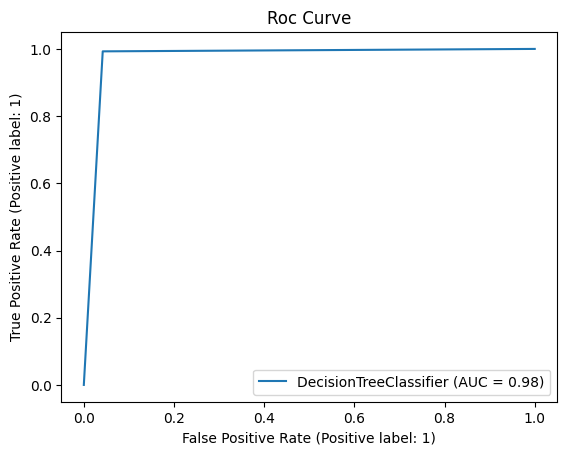

In [ ]:
disp = RocCurveDisplay.from_estimator(dtree, x2_test, y2_test)

plt.title('Roc Curve');


In [ ]:
importances = dtree.feature_importances_
feature_importances = pd.DataFrame({'feature': x2.columns, 'importance': importances})

feature_importances = feature_importances.sort_values('importance', ascending=False)
print(feature_importances)

                   feature  importance
14              recoveries    0.508713
5           inq_last_6mths    0.188656
19              fico_score    0.144780
21   month_since_oldest_tl    0.038533
12             total_pymnt    0.031213
9                revol_bal    0.017713
0                loan_amnt    0.011892
1              installment    0.011117
2               annual_inc    0.007592
18         number_bc_gt_75    0.007361
16           interest_rate    0.005904
15    pub_rec_bankruptcies    0.005046
3                      dti    0.004805
20                     lti    0.003324
8                 open_acc    0.003149
17       revol_utilization    0.002512
10               total_acc    0.001667
11               out_prncp    0.001460
13      total_rec_late_fee    0.001288
6   mths_since_last_delinq    0.000951
23              emp_length    0.000946
25     verification_status    0.000539
22                    term    0.000440
7   mths_since_last_record    0.000378
4              delinq_2yr

In [ ]:
from sklearn.linear_model import LogisticRegression
reg = LogisticRegression()
reg.fit(x2_train,y2_train)
regpred = reg.predict(x2_test)

from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
print(classification_report(y2_test,regpred))
print("Accuracy of Logistic Regression is : ",accuracy_score(y_test,regpred)*100)

              precision    recall  f1-score   support

           0       0.99      0.70      0.82      2528
           1       0.93      1.00      0.96     10233

    accuracy                           0.94     12761
   macro avg       0.96      0.85      0.89     12761
weighted avg       0.94      0.94      0.94     12761

Accuracy of Logistic Regression is :  94.00517200846329


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
import numpy as np
print("Mean Absolute Error : ",mean_absolute_error(y2_test,regpred))
print("Mean Squared Error : ",mean_squared_error(y2_test,regpred))
print("Root Mean Squared Error : ",np.sqrt(mean_squared_error(y2_test,regpred)))
print("R2 Score : ",r2_score(y2_test,regpred))

Mean Absolute Error :  0.059948279915367136
Mean Squared Error :  0.059948279915367136
Root Mean Squared Error :  0.24484337833677908
R2 Score :  0.6226311050621778


In [ ]:
importances = dtree.feature_importances_
feature_importances = pd.DataFrame({'feature': x2.columns, 'importance': importances})

feature_importances = feature_importances.sort_values('importance', ascending=False)
print(feature_importances)

                   feature  importance
14              recoveries    0.508713
5           inq_last_6mths    0.188656
19              fico_score    0.144780
21   month_since_oldest_tl    0.038533
12             total_pymnt    0.031213
9                revol_bal    0.017713
0                loan_amnt    0.011892
1              installment    0.011117
2               annual_inc    0.007592
18         number_bc_gt_75    0.007361
16           interest_rate    0.005904
15    pub_rec_bankruptcies    0.005046
3                      dti    0.004805
20                     lti    0.003324
8                 open_acc    0.003149
17       revol_utilization    0.002512
10               total_acc    0.001667
11               out_prncp    0.001460
13      total_rec_late_fee    0.001288
6   mths_since_last_delinq    0.000951
23              emp_length    0.000946
25     verification_status    0.000539
22                    term    0.000440
7   mths_since_last_record    0.000378
4              delinq_2yr